In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [10]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}] 
    return error

# Train/Test Model

In [11]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [12]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [13]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [14]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,25)

X_train Shape : (12023, 25, 1)
y_train Shape : (12023, 1)
X_test Shape :  (3013, 25, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [15]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [16]:
test1 = test.copy()

In [17]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 12ms/step - loss: 0.0096 - val_loss: 0.0041
Epoch 2/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0026 - val_loss: 0.0037
Epoch 3/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0021 - val_loss: 0.0030
Epoch 4/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 5/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 6/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0010 - val_loss: 0

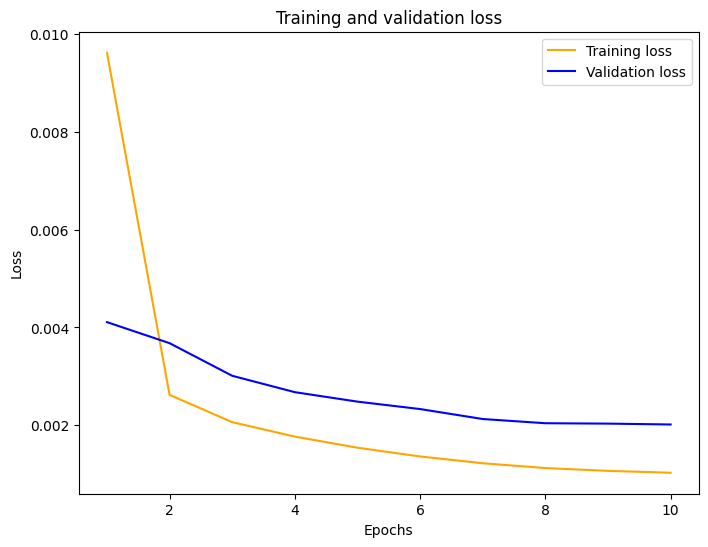

In [18]:
plot_curve(hist_adam)

In [19]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.549154
1,2021-12-10 15:25:00,0.588,0.533571
2,2021-12-10 15:26:00,0.566,0.577441
3,2021-12-10 15:27:00,0.562,0.567200
4,2021-12-10 15:28:00,0.612,0.557340
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.163045
3009,2021-12-16 13:59:00,0.169,0.162610
3010,2021-12-16 14:00:00,0.147,0.163401
3011,2021-12-16 14:01:00,0.145,0.145610


In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [21]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.0020070877587674016,
  'RMSE': 0.044800533018786746,
  'MAE': 0.0215119136923147,
  'MAPE': 0.08513126136159291}]

In [51]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\1239629580.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [23]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 8s 14ms/step - loss: 0.0058 - val_loss: 0.0028
Epoch 2/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 9/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 4s 10ms/step - loss: 9.9703e-04 - va

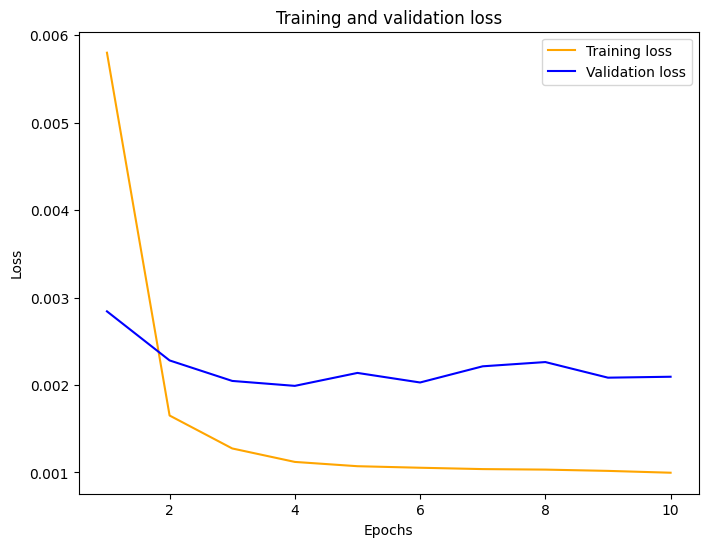

In [24]:
plot_curve(hist_50_rms)

In [25]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.549154,0.542893
1,2021-12-10 15:25:00,0.588,0.533571,0.526040
2,2021-12-10 15:26:00,0.566,0.577441,0.578354
3,2021-12-10 15:27:00,0.562,0.567200,0.553826
4,2021-12-10 15:28:00,0.612,0.557340,0.550638
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.163045,0.161240
3009,2021-12-16 13:59:00,0.169,0.162610,0.161157
3010,2021-12-16 14:00:00,0.147,0.163401,0.162114
3011,2021-12-16 14:01:00,0.145,0.145610,0.141453


In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [27]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0020837540947566827,
  'RMSE': 0.04564815543651991,
  'MAE': 0.023063833346136018,
  'MAPE': 0.08597983342483054}]

In [28]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.08513126136159291


,Model,MSE error
0,model,0.085131
1,model_1,0.085980


In [52]:
data1 = [{'Lags':25 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\3715862764.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [30]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
188/188 [==============================] - 7s 16ms/step - loss: 0.0192 - val_loss: 0.0053
Epoch 2/10
188/188 [==============================] - 2s 13ms/step - loss: 0.0039 - val_loss: 0.0044
Epoch 3/10
188/188 [==============================] - 2s 13ms/step - loss: 0.0030 - val_loss: 0.0039
Epoch 4/10
188/188 [==============================] - 2s 12ms/step - loss: 0.0025 - val_loss: 0.0036
Epoch 5/10
188/188 [==============================] - 2s 12ms/step - loss: 0.0023 - val_loss: 0.0032
Epoch 6/10
188/188 [==============================] - 2s 12ms/step - loss: 0.0020 - val_loss: 0.0032
Epoch 7/10
188/188 [==============================] - 2s 12ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 8/10
188/188 [==============================] - 3s 14ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 9/10
188/188 [==============================] - 2s 13ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 10/10
188/188 [==============================] - 2s 12ms/step - loss: 0.0013 - val_lo

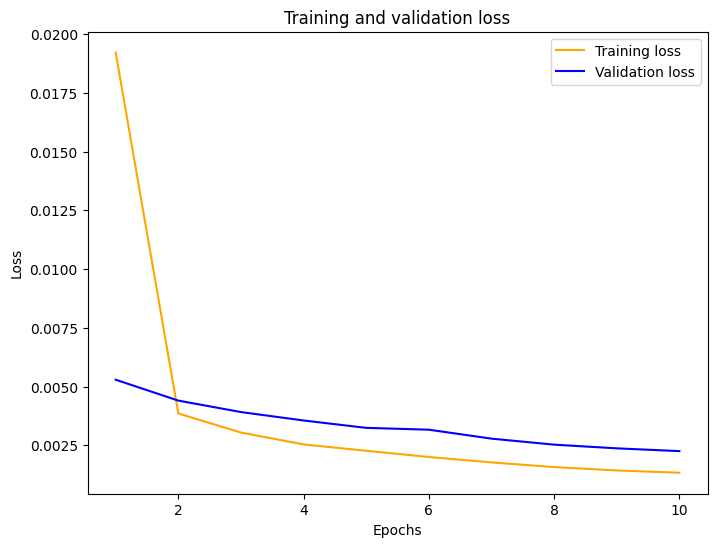

In [31]:
plot_curve(hist_batch_size64)

In [32]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.549154,0.542893,0.563212
1,2021-12-10 15:25:00,0.588,0.533571,0.526040,0.536054
2,2021-12-10 15:26:00,0.566,0.577441,0.578354,0.554869
3,2021-12-10 15:27:00,0.562,0.567200,0.553826,0.564698
4,2021-12-10 15:28:00,0.612,0.557340,0.550638,0.563227
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.163045,0.161240,0.165274
3009,2021-12-16 13:59:00,0.169,0.162610,0.161157,0.165045
3010,2021-12-16 14:00:00,0.147,0.163401,0.162114,0.165335
3011,2021-12-16 14:01:00,0.145,0.145610,0.141453,0.155841


In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [34]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
# error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

In [35]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.08513126136159291


,Model,MSE error
0,model,0.085131
1,model_1,0.087670


In [53]:
data2 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\2892691132.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368


---

### learning rate 0.1

In [37]:
test2 = test.copy()

#### Add frist layer: units = 50

In [38]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 11ms/step - loss: 0.0922 - val_loss: 0.0022
Epoch 2/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0027
Epoch 3/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0013 - val_loss: 0.0025
Epoch 4/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 5/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0013 - val_loss: 0.0025
Epoch 6/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 8/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 10/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_lo

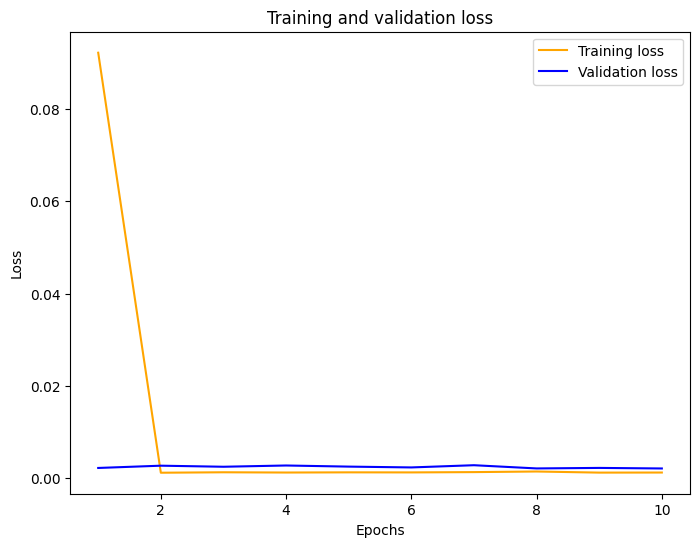

In [39]:
plot_curve(hist_01)

In [40]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.551587
1,2021-12-10 15:25:00,0.588,0.539864
2,2021-12-10 15:26:00,0.566,0.593736
3,2021-12-10 15:27:00,0.562,0.572909
4,2021-12-10 15:28:00,0.612,0.564110
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047
3009,2021-12-16 13:59:00,0.169,0.168973
3010,2021-12-16 14:00:00,0.147,0.169318
3011,2021-12-16 14:01:00,0.145,0.145395


In [41]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [42]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.002096213954938952,
  'RMSE': 0.045784429175637346,
  'MAE': 0.020790956125105984,
  'MAPE': 0.0780146289770968}]

In [43]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.085131
1,model_1,0.078015


In [54]:
data3 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\3785684052.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [55]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 16ms/step - loss: 0.0164 - val_loss: 0.0023
Epoch 2/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 4/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0041
Epoch 7/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0011 - val_l

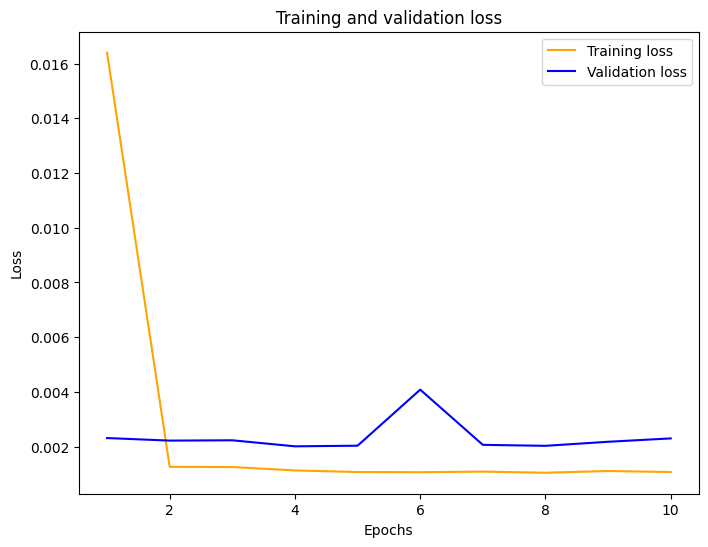

In [56]:
plot_curve(hist_005)

In [57]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.551587,0.535583
1,2021-12-10 15:25:00,0.588,0.539864,0.519561
2,2021-12-10 15:26:00,0.566,0.593736,0.574826
3,2021-12-10 15:27:00,0.562,0.572909,0.544333
4,2021-12-10 15:28:00,0.612,0.564110,0.542423
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.155284
3009,2021-12-16 13:59:00,0.169,0.168973,0.155418
3010,2021-12-16 14:00:00,0.147,0.169318,0.156718
3011,2021-12-16 14:01:00,0.145,0.145395,0.133556


In [58]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [59]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.0022847049165422785,
  'RMSE': 0.04779858697223464,
  'MAE': 0.02733017189324661,
  'MAPE': 0.10558495889078219}]

In [60]:
compare_model(lstm_mape_error3,lstm_mape_error4)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.105585


In [61]:
data4 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\1660212170.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [62]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 17ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 2/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 3/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 4/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 9/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_l

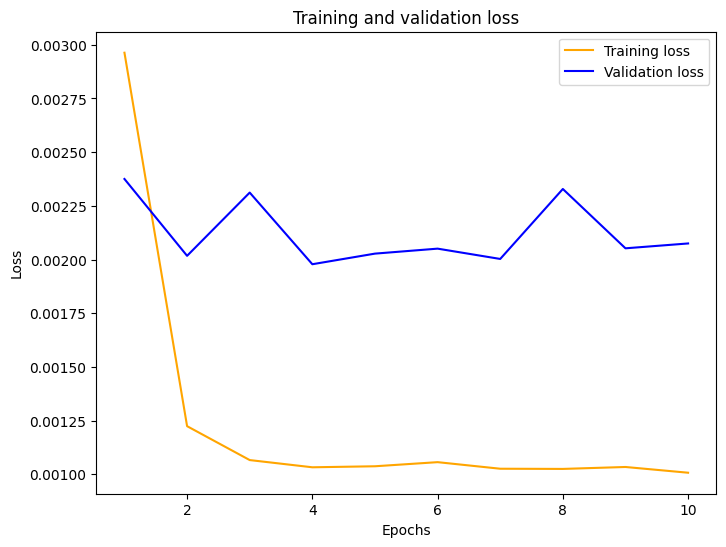

In [63]:
plot_curve(hist_001)

In [64]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.551587,0.535583,0.554336
1,2021-12-10 15:25:00,0.588,0.539864,0.519561,0.532693
2,2021-12-10 15:26:00,0.566,0.593736,0.574826,0.589594
3,2021-12-10 15:27:00,0.562,0.572909,0.544333,0.551361
4,2021-12-10 15:28:00,0.612,0.564110,0.542423,0.557391
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.155284,0.163885
3009,2021-12-16 13:59:00,0.169,0.168973,0.155418,0.164256
3010,2021-12-16 14:00:00,0.147,0.169318,0.156718,0.165138
3011,2021-12-16 14:01:00,0.145,0.145395,0.133556,0.141898


In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [66]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.0020643951161088358,
  'RMSE': 0.04543561506251275,
  'MAE': 0.02232651868491742,
  'MAPE': 0.0782836441460757}]

In [67]:
compare_model(lstm_mape_error3,lstm_mape_error5)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.078284


In [68]:
data5 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\2428393736.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [69]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 21ms/step - loss: 0.0053 - val_loss: 0.0030
Epoch 2/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 3/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 4/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 5s 12ms/step - loss: 9.7830e-04 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 4s 12ms/step - loss: 9.9814e-04 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 12ms/step - loss: 9.9035e-04 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 5s 12ms/step - loss: 9.

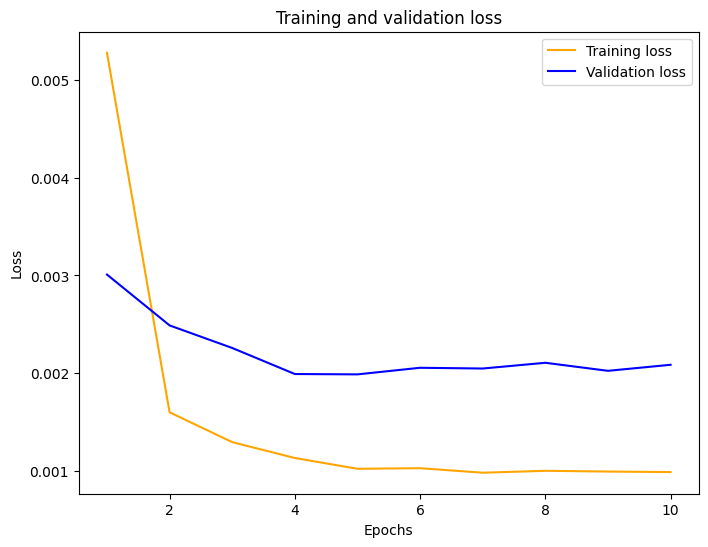

In [70]:
plot_curve(hist_0005)

In [71]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.551587,0.535583,0.554336,0.567472
1,2021-12-10 15:25:00,0.588,0.539864,0.519561,0.532693,0.545839
2,2021-12-10 15:26:00,0.566,0.593736,0.574826,0.589594,0.602487
3,2021-12-10 15:27:00,0.562,0.572909,0.544333,0.551361,0.565616
4,2021-12-10 15:28:00,0.612,0.564110,0.542423,0.557391,0.570342
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.155284,0.163885,0.172502
3009,2021-12-16 13:59:00,0.169,0.168973,0.155418,0.164256,0.172583
3010,2021-12-16 14:00:00,0.147,0.169318,0.156718,0.165138,0.173511
3011,2021-12-16 14:01:00,0.145,0.145395,0.133556,0.141898,0.151873


In [72]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [73]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

[{'MSE': 0.002073861128659878,
  'RMSE': 0.04553966544299462,
  'MAE': 0.021713486851616785,
  'MAPE': 0.08382207463695307}]

In [74]:
compare_model(lstm_mape_error3,lstm_mape_error6)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.083822


In [75]:
data5 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\662684776.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,,,,,1,10,0.021713,0.083822,0.002074,0.045540


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [76]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 14s 23ms/step - loss: 0.0113 - val_loss: 0.0042
Epoch 2/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0028 - val_loss: 0.0035
Epoch 3/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0022 - val_loss: 0.0031
Epoch 4/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 5/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 6/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 7/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_l

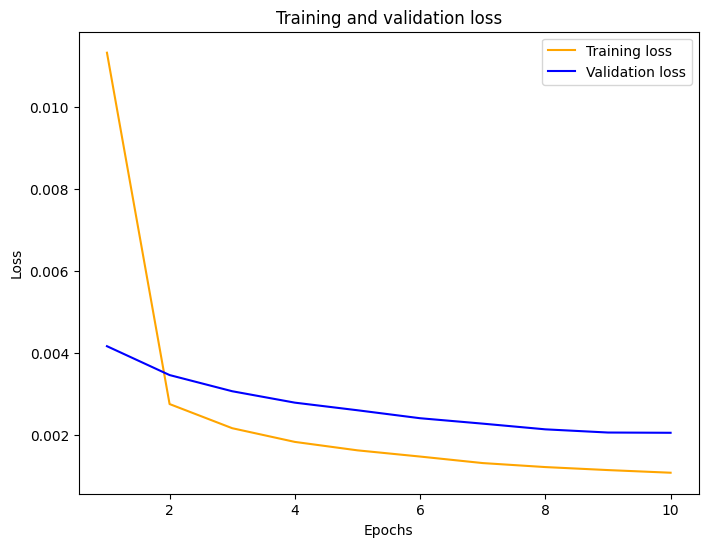

In [77]:
plot_curve(hist_0001)

In [78]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.551587,0.535583,0.554336,0.567472,0.554336
1,2021-12-10 15:25:00,0.588,0.539864,0.519561,0.532693,0.545839,0.532693
2,2021-12-10 15:26:00,0.566,0.593736,0.574826,0.589594,0.602487,0.589594
3,2021-12-10 15:27:00,0.562,0.572909,0.544333,0.551361,0.565616,0.551361
4,2021-12-10 15:28:00,0.612,0.564110,0.542423,0.557391,0.570342,0.557391
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.155284,0.163885,0.172502,0.163885
3009,2021-12-16 13:59:00,0.169,0.168973,0.155418,0.164256,0.172583,0.164256
3010,2021-12-16 14:00:00,0.147,0.169318,0.156718,0.165138,0.173511,0.165138
3011,2021-12-16 14:01:00,0.145,0.145395,0.133556,0.141898,0.151873,0.141898


In [79]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [80]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.0020643951161088358,
  'RMSE': 0.04543561506251275,
  'MAE': 0.02232651868491742,
  'MAPE': 0.0782836441460757}]

In [81]:
compare_model(lstm_mape_error3,lstm_mape_error7)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.078284


In [82]:
data6 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\619738133.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,,,,,1,10,0.021713,0.083822,0.002074,0.045540
7,25,Adam,32,0.001,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [83]:
test3 = test.copy()

In [84]:
test3['LSTM_50'] = predict_01

In [85]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 14s 26ms/step - loss: 0.2897 - val_loss: 0.0030
Epoch 2/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 3/10
376/376 [==============================] - 7s 17ms/step - loss: 0.0020 - val_loss: 0.0024
Epoch 4/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 5/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0025 - val_loss: 0.0052
Epoch 6/10
376/376 [==============================] - 7s 20ms/step - loss: 0.0028 - val_loss: 0.0030
Epoch 7/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0033 - val_loss: 0.0030
Epoch 8/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0025 - val_loss: 0.0030
Epoch 10/10
376/376 [==============================] - 7s 19ms/step - loss: 0.0033 - val_l

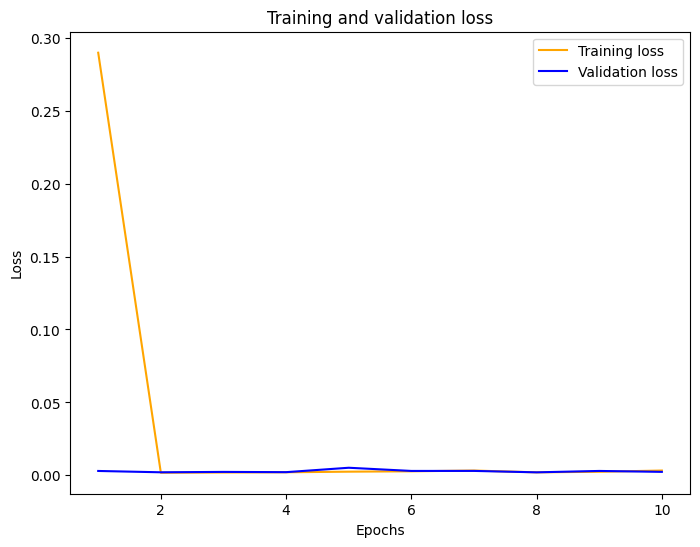

In [86]:
plot_curve(hist_1)

In [87]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.551587,0.580635
1,2021-12-10 15:25:00,0.588,0.539864,0.562186
2,2021-12-10 15:26:00,0.566,0.593736,0.612471
3,2021-12-10 15:27:00,0.562,0.572909,0.591042
4,2021-12-10 15:28:00,0.612,0.564110,0.587557
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.176097
3009,2021-12-16 13:59:00,0.169,0.168973,0.175948
3010,2021-12-16 14:00:00,0.147,0.169318,0.177281
3011,2021-12-16 14:01:00,0.145,0.145395,0.156811


In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [89]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

[{'MSE': 0.002376919087795031,
  'RMSE': 0.04875365717353962,
  'MAE': 0.02793240170505725,
  'MAPE': 0.10991657532197274}]

In [90]:
compare_model(lstm_mape_error3,lstm_mape_error8)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.109917


In [91]:
data7 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\3753667617.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,,,,,1,10,0.021713,0.083822,0.002074,0.045540
7,25,Adam,32,0.001,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
8,25,Adam,32,0.1,100,,,,,1,10,0.027932,0.109917,0.002377,0.048754


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [92]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 19ms/step - loss: 0.0869 - val_loss: 0.0023
Epoch 2/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0032 - val_loss: 0.0021
Epoch 3/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0026 - val_loss: 0.0024
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0020 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0020 - val_loss: 0.0022
Epoch 9/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 10/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0019 - val_l

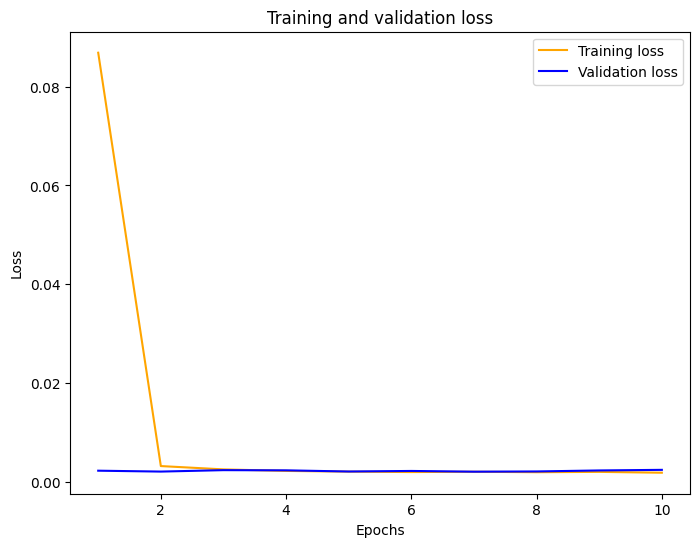

In [93]:
plot_curve(hist_2)

In [94]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.551587,0.580635,0.564982
1,2021-12-10 15:25:00,0.588,0.539864,0.562186,0.545288
2,2021-12-10 15:26:00,0.566,0.593736,0.612471,0.601242
3,2021-12-10 15:27:00,0.562,0.572909,0.591042,0.585559
4,2021-12-10 15:28:00,0.612,0.564110,0.587557,0.578396
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.176097,0.188178
3009,2021-12-16 13:59:00,0.169,0.168973,0.175948,0.189417
3010,2021-12-16 14:00:00,0.147,0.169318,0.177281,0.189878
3011,2021-12-16 14:01:00,0.145,0.145395,0.156811,0.162848


In [95]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [96]:
lstm_mse_error_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
error(lstm_mse_error_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

[{'MSE': 0.002470165664682417,
  'RMSE': 0.049700761208279466,
  'MAE': 0.03121702150249754,
  'MAPE': 0.18641811796688657}]

In [97]:
compare_model(lstm_mape_error3,lstm_mape_error9)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.186418


In [98]:
data8 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\731014377.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,,,,,1,10,0.021713,0.083822,0.002074,0.045540
7,25,Adam,32,0.001,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
8,25,Adam,32,0.1,100,,,,,1,10,0.027932,0.109917,0.002377,0.048754
9,25,Adam,32,0.1,50,0.1,,,,1,10,0.031217,0.186418,0.002470,0.049701


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [99]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 17s 28ms/step - loss: 0.1149 - val_loss: 0.0023
Epoch 2/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0014 - val_loss: 0.0026
Epoch 3/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0014 - val_loss: 0.0025
Epoch 4/10
376/376 [==============================] - 8s 21ms/step - loss: 0.0016 - val_loss: 0.0032
Epoch 5/10
376/376 [==============================] - 8s 21ms/step - loss: 0.0016 - val_loss: 0.0028
Epoch 6/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 7/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 8/10
376/376 [==============================] - 8s 20ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 9/10
376/376 [==============================] - 8s 22ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 10/10
376/376 [==============================] - 8s 21ms/step - loss: 0.0020 - val_l

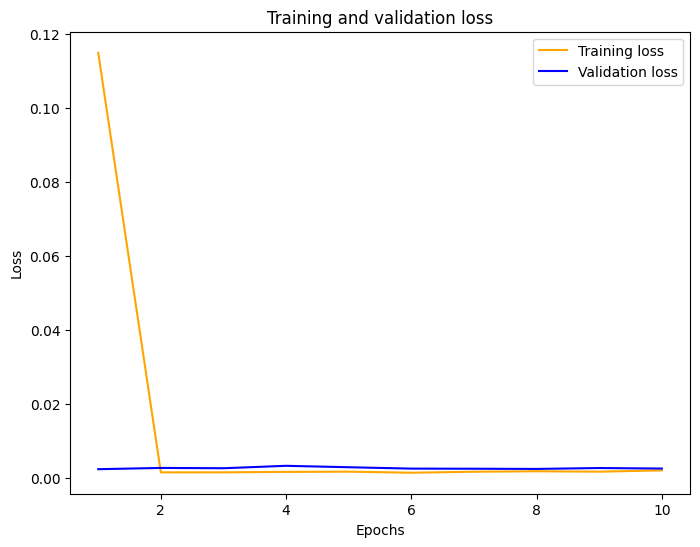

In [100]:
plot_curve(hist_3)

In [101]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 9ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.551587,0.580635,0.564982,0.538960
1,2021-12-10 15:25:00,0.588,0.539864,0.562186,0.545288,0.527062
2,2021-12-10 15:26:00,0.566,0.593736,0.612471,0.601242,0.596748
3,2021-12-10 15:27:00,0.562,0.572909,0.591042,0.585559,0.554964
4,2021-12-10 15:28:00,0.612,0.564110,0.587557,0.578396,0.554351
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.176097,0.188178,0.151479
3009,2021-12-16 13:59:00,0.169,0.168973,0.175948,0.189417,0.152142
3010,2021-12-16 14:00:00,0.147,0.169318,0.177281,0.189878,0.153141
3011,2021-12-16 14:01:00,0.145,0.145395,0.156811,0.162848,0.124938


In [102]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [103]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


[{'MSE': 0.0024455340704005353,
  'RMSE': 0.04945234140463458,
  'MAE': 0.028495407404132627,
  'MAPE': 0.1255183744324846}]

In [104]:
compare_model(lstm_mape_error3,lstm_mape_error11)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.125518


In [105]:
data10 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\1551605211.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,,,,,1,10,0.021713,0.083822,0.002074,0.045540
7,25,Adam,32,0.001,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
8,25,Adam,32,0.1,100,,,,,1,10,0.027932,0.109917,0.002377,0.048754
9,25,Adam,32,0.1,50,0.1,,,,1,10,0.031217,0.186418,0.002470,0.049701


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [106]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
376/376 [==============================] - 11s 19ms/step - loss: 0.1610 - val_loss: 0.0025
Epoch 2/20
376/376 [==============================] - 4s 12ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 3/20
376/376 [==============================] - 4s 12ms/step - loss: 0.0020 - val_loss: 0.0071
Epoch 4/20
376/376 [==============================] - 4s 11ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 5/20
376/376 [==============================] - 4s 10ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 6/20
376/376 [==============================] - 4s 10ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 7/20
376/376 [==============================] - 4s 10ms/step - loss: 0.0020 - val_loss: 0.0023
Epoch 8/20
376/376 [==============================] - 4s 11ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 9/20
376/376 [==============================] - 4s 10ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 10/20
376/376 [==============================] - 4s 11ms/step - loss: 0.0013 - val_l

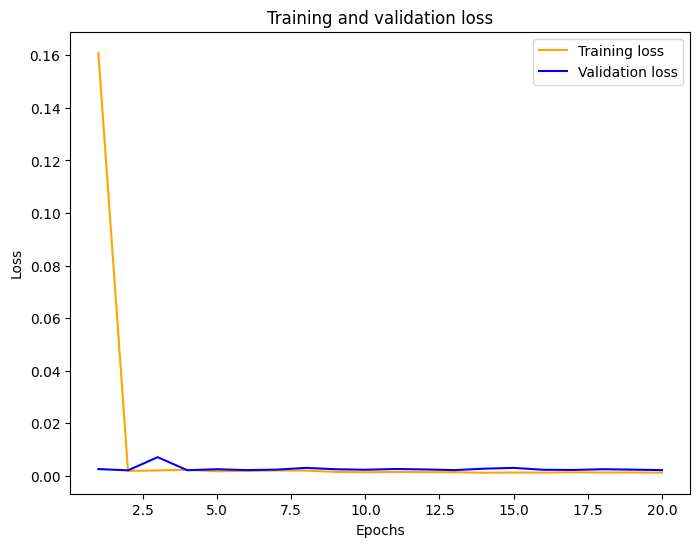

In [107]:
plot_curve(hist_5)

In [108]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.551587,0.580635,0.564982,0.538960,0.552173
1,2021-12-10 15:25:00,0.588,0.539864,0.562186,0.545288,0.527062,0.537423
2,2021-12-10 15:26:00,0.566,0.593736,0.612471,0.601242,0.596748,0.590363
3,2021-12-10 15:27:00,0.562,0.572909,0.591042,0.585559,0.554964,0.576640
4,2021-12-10 15:28:00,0.612,0.564110,0.587557,0.578396,0.554351,0.568002
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168047,0.176097,0.188178,0.151479,0.169627
3009,2021-12-16 13:59:00,0.169,0.168973,0.175948,0.189417,0.152142,0.170051
3010,2021-12-16 14:00:00,0.147,0.169318,0.177281,0.189878,0.153141,0.170965
3011,2021-12-16 14:01:00,0.145,0.145395,0.156811,0.162848,0.124938,0.146619


In [109]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [110]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

[{'MSE': 0.0021357270963958796,
  'RMSE': 0.046213927515370075,
  'MAE': 0.02176613137130173,
  'MAPE': 0.08319243008408739}]

In [111]:
compare_model(lstm_mape_error3,lstm_mape_error12)

Better MSE value is :  0.0780146289770968


,Model,MSE error
0,model,0.078015
1,model_1,0.083192


In [112]:
data11 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_7440\2007078058.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,,50,,,,,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,,50,,,,,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.1,50,,,,,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.05,50,,,,,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.01,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,,,,,1,10,0.021713,0.083822,0.002074,0.045540
7,25,Adam,32,0.001,50,,,,,1,10,0.022327,0.078284,0.002064,0.045436
8,25,Adam,32,0.1,100,,,,,1,10,0.027932,0.109917,0.002377,0.048754
9,25,Adam,32,0.1,50,0.1,,,,1,10,0.031217,0.186418,0.002470,0.049701


---

# save model

In [ ]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [113]:
mse_data.to_csv('data_lstm_mse_lag25.csv',index=False)

In [114]:
lstm = pd.read_csv('data_lstm_mse_lag25.csv')

In [115]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.021512,0.085131,0.002007,0.044801
1,25,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.023064,0.085980,0.002084,0.045648
2,25,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.024111,0.087670,0.002244,0.047368
3,25,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.020791,0.078015,0.002096,0.045784
4,25,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.027330,0.105585,0.002285,0.047799
5,25,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.022327,0.078284,0.002064,0.045436
6,25,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.021713,0.083822,0.002074,0.045540
7,25,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.022327,0.078284,0.002064,0.045436
8,25,Adam,32,0.100,100,NaN,NaN,NaN,NaN,1,10,0.027932,0.109917,0.002377,0.048754
9,25,Adam,32,0.100,50,0.1,NaN,NaN,NaN,1,10,0.031217,0.186418,0.002470,0.049701


# error

In [116]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002007,0.044801
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.020791,0.078015,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [117]:
model_01.save('model_train_80%_lag25.h5')